In [1]:
import alpaca_trade_api as alpaca
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf
import hvplot.pandas

# Replace YOUR_API_KEY and YOUR_API_SECRET with your Alpaca API key and secret
alpaca_api = alpaca.REST('PKU5LEIDZZV83Y5ENASI', 'nvzOwJpyvr73GTitTDyga0MkI2Qd6RsK4PmhItbu', api_version='v2')

# Set the ticker symbol and time frame 
ticker = "XLF"
timeframe = "60Min"

# Set the start and end dates for the data
start_date = "2008-01-01T00:00:00-00:00"
end_date = "2022-12-31T00:00:00-00:00"

# Retrieve the data
data = alpaca_api.get_bars(ticker,  timeframe, start_date, end_date).df

# Convert the data to a Pandas dataframe
df = pd.DataFrame(data)

df['HH21']=df['high'].rolling(21).max()
df['LL21']=df['low'].rolling(21).min()
df['50Pct']=0.5*(df['HH21']-df['LL21'])
df['61Pct']=(1-0.615)*(df['HH21']-df['LL21'])

df['50R']=df['close']/df['50Pct']
df['61R']=df['close']/df['61Pct']


# Calculate the 3 period moving average of the close
df['Mid']=(df['high']+df['low'])/2
df['3dH']=(df['high'].rolling(3).max().shift(-3))-df['close']#Shift this before subtracting close!!!!!!!!
df['3dL']=df['close']-(df['low'].rolling(3).min().shift(-3))
df['RewardRisk']=df['3dH']/df['3dL']

df['CPctile']=(df['high']-df['close'])/(df['high']-df['low'])
df['OPctile']=(df['high']-df['open'])/(df['high']-df['low'])

df['Range']=df['high']-df['low']
df['RangeT']=(df['Range']-df['Range'].rolling(30).mean())/df['Range'].rolling(30).std()

# Calculate the 20 period moving average of the close
#df['20MA'] = df['close'].rolling(20).mean()

#df['RewardRisk']=df['RewardRisk'].shift(-3)




df['close']=df['close'].pct_change()
df['Mid']=df['Mid'].pct_change()
df=df.drop(columns=['open','high','low','volume','trade_count','vwap','3dH','3dL','Range'])
           
df["Signal"] = 0.0
           



In [2]:
dfCopy=df.copy()

dfCopy=dfCopy.reset_index()

display(dfCopy)


for index, row in dfCopy.iterrows():
    
    if index>2 and index<4:
        print(dfCopy.loc[index-1, 'close'] )
        print(dfCopy.loc[index-2, 'close'])
       
        

,timestamp,close,HH21,LL21,50Pct,61Pct,50R,61R,Mid,RewardRisk,CPctile,OPctile,RangeT,Signal
0,2015-12-01 13:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,inf,1.000000,0.000000,NaN,0.0
1,2015-12-01 14:00:00+00:00,0.007317,NaN,NaN,NaN,NaN,NaN,NaN,0.002841,0.000000,0.150000,0.800000,NaN,0.0
2,2015-12-01 15:00:00+00:00,-0.003228,NaN,NaN,NaN,NaN,NaN,NaN,-0.000809,0.126263,0.444444,0.055556,NaN,0.0
3,2015-12-01 16:00:00+00:00,-0.001619,NaN,NaN,NaN,NaN,NaN,NaN,-0.000996,5.000000,0.560538,0.112108,NaN,0.0
4,2015-12-01 17:00:00+00:00,0.001825,NaN,NaN,NaN,NaN,NaN,NaN,0.000389,2.454545,0.071429,0.714286,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25122,2022-12-30 19:00:00+00:00,-0.001908,34.38,33.92,0.23,0.1771,147.609130,191.700169,-0.002274,3899.000000,0.726612,0.137148,0.376429,0.0
25123,2022-12-30 20:00:00+00:00,0.007655,34.38,33.92,0.23,0.1771,148.739130,193.167702,0.003678,13.000000,0.133333,1.000000,2.693081,0.0
25124,2022-12-30 21:00:00+00:00,0.002923,34.38,33.92,0.23,0.1771,149.173913,193.732355,0.004985,NaN,0.214286,0.928571,0.550633,0.0
25125,2022-12-30 22:00:00+00:00,-0.000583,34.38,33.92,0.23,0.1771,149.086957,193.619424,0.000875,NaN,1.000000,0.500000,-1.044862,0.0


-0.0032284100080710587
0.007317073170731714


In [3]:
for index, row in df.iterrows():
    if row["Mid"] >= 0:
       df.loc[index, "Signal"] = 1.0
    if row["Mid"] < 0:
        df.loc[index,"Signal"] = 0.0
        
'''for index, row in df.iterrows():
    if row["RewardRisk"] >= 2:
       df.loc[index, "Signal"] = 1.0
    if row["RewardRisk"] < 2:
        df.loc[index,"Signal"] = 0.0'''
# Calculate the points in time at which a position should be taken, 1 or -1
#ema_signals_df['Crossover']= ema_signals_df['Signal'].diff()
#ema_signals_df=ema_signals_df.dropna()
#ema_signals_df['Crossover']=ema_signals_df['Crossover'].shift(-8)
df["Signal"]=df["Signal"].shift(-1)
df['FutureSlope']=df["Mid"].shift(-1)
#df['RR']=df["RewardRisk"]

'''ema_signals_df['Crossover']=ema_signals_df['Signal'].diff()
# Review the DataFrame
#ema_signals_df=ema_signals_df['Crossover'].dropna()
ema_signals_df=ema_signals_df.dropna()'''
df.tail(100)

,close,HH21,LL21,50Pct,61Pct,50R,61R,Mid,RewardRisk,CPctile,OPctile,RangeT,Signal,FutureSlope
timestamp,,,,,,,,,,,,,,
2022-12-21 20:00:00+00:00,0.001764,34.16,33.50,0.33,0.2541,103.272727,134.120425,-0.000698,1.5,0.078431,0.549020,0.103494,1.0,0.001727
2022-12-21 21:00:00+00:00,0.000587,34.16,33.50,0.33,0.2541,103.333333,134.199134,0.001727,1.0,0.200000,1.000000,-1.035104,0.0,-0.000147
2022-12-21 22:00:00+00:00,-0.000880,34.16,33.50,0.33,0.2541,103.242424,134.081070,-0.000147,inf,1.000000,0.000000,-1.416078,1.0,0.000293
2022-12-21 23:00:00+00:00,0.000587,34.16,33.50,0.33,0.2541,103.303030,134.159780,0.000293,0.5,NaN,NaN,-1.622814,1.0,0.000293
2022-12-22 00:00:00+00:00,0.001173,34.16,33.50,0.33,0.2541,103.424242,134.317198,0.000293,0.0,0.000000,0.666667,-0.810765,1.0,0.000440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-30 19:00:00+00:00,-0.001908,34.38,33.92,0.23,0.1771,147.609130,191.700169,-0.002274,3899.0,0.726612,0.137148,0.376429,1.0,0.003678
2022-12-30 20:00:00+00:00,0.007655,34.38,33.92,0.23,0.1771,148.739130,193.167702,0.003678,13.0,0.133333,1.000000,2.693081,1.0,0.004985
2022-12-30 21:00:00+00:00,0.002923,34.38,33.92,0.23,0.1771,149.173913,193.732355,0.004985,NaN,0.214286,0.928571,0.550633,1.0,0.000875


In [4]:
df.tail(100)

,close,HH21,LL21,50Pct,61Pct,50R,61R,Mid,RewardRisk,CPctile,OPctile,RangeT,Signal,FutureSlope
timestamp,,,,,,,,,,,,,,
2022-12-21 20:00:00+00:00,0.001764,34.16,33.50,0.33,0.2541,103.272727,134.120425,-0.000698,1.5,0.078431,0.549020,0.103494,1.0,0.001727
2022-12-21 21:00:00+00:00,0.000587,34.16,33.50,0.33,0.2541,103.333333,134.199134,0.001727,1.0,0.200000,1.000000,-1.035104,0.0,-0.000147
2022-12-21 22:00:00+00:00,-0.000880,34.16,33.50,0.33,0.2541,103.242424,134.081070,-0.000147,inf,1.000000,0.000000,-1.416078,1.0,0.000293
2022-12-21 23:00:00+00:00,0.000587,34.16,33.50,0.33,0.2541,103.303030,134.159780,0.000293,0.5,NaN,NaN,-1.622814,1.0,0.000293
2022-12-22 00:00:00+00:00,0.001173,34.16,33.50,0.33,0.2541,103.424242,134.317198,0.000293,0.0,0.000000,0.666667,-0.810765,1.0,0.000440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-30 19:00:00+00:00,-0.001908,34.38,33.92,0.23,0.1771,147.609130,191.700169,-0.002274,3899.0,0.726612,0.137148,0.376429,1.0,0.003678
2022-12-30 20:00:00+00:00,0.007655,34.38,33.92,0.23,0.1771,148.739130,193.167702,0.003678,13.0,0.133333,1.000000,2.693081,1.0,0.004985
2022-12-30 21:00:00+00:00,0.002923,34.38,33.92,0.23,0.1771,149.173913,193.732355,0.004985,NaN,0.214286,0.928571,0.550633,1.0,0.000875


In [5]:
#display(df.hvplot.scatter(y='CloseDiff3MA',x='3MASlope'))

lstColumns=df.columns

display(lstColumns)

dfopt=pd.DataFrame()

'''for column in lstColumns:
    display(df.hvplot.scatter(y='FutureSlope',x=column))
    dfopt=df[['FutureSlope',column]]
    display(dfopt.corr())'''
    
for column in lstColumns:
    display(df.hvplot.scatter(y='FutureSlope',x=column))
    dfopt=df[['FutureSlope',column]]
    display(dfopt.corr())

Index(['close', 'HH21', 'LL21', '50Pct', '61Pct', '50R', '61R', 'Mid',
       'RewardRisk', 'CPctile', 'OPctile', 'RangeT', 'Signal', 'FutureSlope'],
      dtype='object')

:Scatter   [close]   (FutureSlope)

,FutureSlope,close
FutureSlope,1.000000,0.315979
close,0.315979,1.000000


:Scatter   [HH21]   (FutureSlope)

,FutureSlope,HH21
FutureSlope,1.000000,-0.011508
HH21,-0.011508,1.000000


:Scatter   [LL21]   (FutureSlope)

,FutureSlope,LL21
FutureSlope,1.000000,-0.009781
LL21,-0.009781,1.000000


:Scatter   [50Pct]   (FutureSlope)

,FutureSlope,50Pct
FutureSlope,1.000000,-0.023192
50Pct,-0.023192,1.000000


:Scatter   [61Pct]   (FutureSlope)

,FutureSlope,61Pct
FutureSlope,1.000000,-0.023192
61Pct,-0.023192,1.000000


:Scatter   [50R]   (FutureSlope)

,FutureSlope,50R
FutureSlope,1.000000,0.004258
50R,0.004258,1.000000


:Scatter   [61R]   (FutureSlope)

,FutureSlope,61R
FutureSlope,1.000000,0.004258
61R,0.004258,1.000000


:Scatter   [Mid]   (FutureSlope)

,FutureSlope,Mid
FutureSlope,1.000000,0.112301
Mid,0.112301,1.000000


:Scatter   [RewardRisk]   (FutureSlope)

,FutureSlope,RewardRisk
FutureSlope,1.000000,-0.033403
RewardRisk,-0.033403,1.000000


:Scatter   [CPctile]   (FutureSlope)

,FutureSlope,CPctile
FutureSlope,1.000000,-0.347973
CPctile,-0.347973,1.000000


:Scatter   [OPctile]   (FutureSlope)

,FutureSlope,OPctile
FutureSlope,1.000000,0.174221
OPctile,0.174221,1.000000


:Scatter   [RangeT]   (FutureSlope)

,FutureSlope,RangeT
FutureSlope,1.000000,-0.027427
RangeT,-0.027427,1.000000


:Scatter   [Signal]   (FutureSlope)

,FutureSlope,Signal
FutureSlope,1.000000,0.573175
Signal,0.573175,1.000000


:Scatter   [FutureSlope]   (FutureSlope)

,FutureSlope,FutureSlope
FutureSlope,1.0,1.0
FutureSlope,1.0,1.0


In [6]:
df=df.dropna()

y = df['Signal']

# Review the value counts
y.value_counts()

1.0    12267
0.0    10874
Name: Signal, dtype: int64

In [7]:
# Select the start of the training period

from datetime import datetime
from pandas.tseries.offsets import DateOffset
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from pandas.tseries.offsets import DateOffset
from sklearn.metrics import classification_report

X = df[['50Pct','61Pct','RangeT','OPctile','CPctile']].dropna()




training_begin = X.index.min()

# Display the training begin date
print(training_begin)

training_end = X.index.min() + DateOffset(months=71)

# Display the training end date
print(training_end)

# Generate the X_train and y_train DataFrames
X_train = X.loc[training_begin:training_end]
y_train = y.loc[training_begin:training_end]

# Review the X_train DataFrame
display(X_train.head())
display(X_train.tail())

# Generate the X_test and y_test DataFrames
X_test = X.loc[training_end+DateOffset(hours=1):]
y_test = y.loc[training_end+DateOffset(hours=1):]

# Review the X_test DataFrame
X_test.head()

# Scale the features DataFrames

# Create a StandardScaler instance
scaler = StandardScaler()

# Apply the scaler model to fit the X-train data
X_scaler = scaler.fit(X_train)

# Transform the X_train and X_test DataFrames using the X_scaler
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

2015-12-03 20:00:00+00:00
2021-11-03 20:00:00+00:00


,50Pct,61Pct,RangeT,OPctile,CPctile
timestamp,,,,,
2015-12-03 20:00:00+00:00,0.420,0.32340,0.314118,0.192308,0.384615
2015-12-03 21:00:00+00:00,0.415,0.31955,0.437243,0.857143,0.142857
2015-12-03 22:00:00+00:00,0.395,0.30415,-0.887495,0.200000,0.200000
2015-12-03 23:00:00+00:00,0.395,0.30415,-1.408487,0.000000,0.000000
2015-12-04 13:00:00+00:00,0.395,0.30415,0.731454,1.000000,0.600000


,50Pct,61Pct,RangeT,OPctile,CPctile
timestamp,,,,,
2021-11-03 16:00:00+00:00,0.1975,0.152075,0.081968,0.111111,0.333333
2021-11-03 17:00:00+00:00,0.1975,0.152075,0.174835,0.052632,0.368421
2021-11-03 18:00:00+00:00,0.2350,0.180950,2.903351,0.939394,0.136364
2021-11-03 19:00:00+00:00,0.2550,0.196350,0.837716,0.515152,0.909091
2021-11-03 20:00:00+00:00,0.2550,0.196350,-0.592892,0.200000,0.600000


In [8]:
# From SVM, instantiate SVC classifier model instance
svm_model = svm.SVC(probability=True) 
# Fit the model to the data using the training data
svm_model = svm_model.fit(X_train_scaled, y_train)
# Use the testing data to make the model predictions
svm_pred = svm_model.predict(X_test_scaled)

# Review the model's predicted values
svm_pred

# Use a classification report to evaluate the model using the predictions and testing data
svm_testing_report = classification_report(y_test, svm_pred)

# Print the classification report
print(svm_testing_report)


              precision    recall  f1-score   support

         0.0       0.72      0.69      0.71      2188
         1.0       0.72      0.74      0.73      2335

    accuracy                           0.72      4523
   macro avg       0.72      0.72      0.72      4523
weighted avg       0.72      0.72      0.72      4523



In [9]:
4991/9151

0.5454048737842858

/Users/saibal/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(


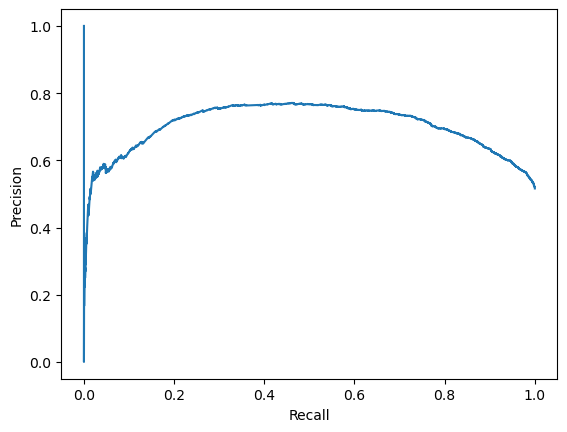

/var/folders/j2/5j3b6rgj5llcnsz3cgz6xqfm0000gq/T/ipykernel_18008/988179411.py:17: RuntimeWarning: invalid value encountered in true_divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


IndexError: index 4449 is out of bounds for axis 0 with size 4449

In [10]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
import numpy as np


y_probs = svm_model.predict_proba(X_test)[:, 1]

precision, recall, thresholds = precision_recall_curve(y_test, y_probs)

# Plot the precision-recall curve
plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.show()

# Find the threshold with the highest F1 score
f1_scores = 2 * (precision * recall) / (precision + recall)
best_threshold_index = np.argmax(precision)
best_threshold = thresholds[best_threshold_index]

# Make predictions with the best threshold
y_pred = (y_probs <= best_threshold).astype(int)

In [ ]:
print(best_threshold)

print(np.argmax(precision))

svm_testing_report = classification_report(y_test, y_pred)

# Print the classification report
print(svm_testing_report)

In [ ]:
X_test

In [59]:
for x in range(1,100,1):
    threshold=float(x)/100
    print(threshold)
    y_pred = (y_probs >= threshold).astype(int)
    svm_testing_report = classification_report(y_test, y_pred)

    # Print the classification report
    print(svm_testing_report)
    
    

0.01
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       232
         1.0       0.54      1.00      0.70       270

    accuracy                           0.54       502
   macro avg       0.27      0.50      0.35       502
weighted avg       0.29      0.54      0.38       502

0.02
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       232
         1.0       0.54      1.00      0.70       270

    accuracy                           0.54       502
   macro avg       0.27      0.50      0.35       502
weighted avg       0.29      0.54      0.38       502

0.03
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       232
         1.0       0.54      1.00      0.70       270

    accuracy                           0.54       502
   macro avg       0.27      0.50      0.35       502
weighted avg       0.29      0.54      0.38       502

0.04

/Users/saibal/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/saibal/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/saibal/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/saibal/op